In [1]:
import os
import sys
sys.path.insert(0, os.getcwd())
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import mindspore as ms
ms.set_context(device_target="Ascend", device_id=1, mode=0)

In [3]:
from mindformers.pipeline import pipeline
pipeline_task = pipeline("segment_anything", model='sam_vit_h')

[WARNING] ME(2221062:281467275462720,MainProcess):2023-08-23-17:17:59.883.087 [mindspore/train/serialization.py:167] The type of image_encoder.blocks.0.attn.rel_pos_h:Float32 in 'parameter_dict' is different from the type of it in 'net':Float16, then the type convert from Float32 to Float16 in the network.
[WARNING] ME(2221062:281467275462720,MainProcess):2023-08-23-17:17:59.885.262 [mindspore/train/serialization.py:167] The type of image_encoder.blocks.0.attn.rel_pos_w:Float32 in 'parameter_dict' is different from the type of it in 'net':Float16, then the type convert from Float32 to Float16 in the network.
[WARNING] ME(2221062:281467275462720,MainProcess):2023-08-23-17:17:59.919.213 [mindspore/train/serialization.py:167] The type of image_encoder.blocks.1.attn.rel_pos_h:Float32 in 'parameter_dict' is different from the type of it in 'net':Float16, then the type convert from Float32 to Float16 in the network.
[WARNING] ME(2221062:281467275462720,MainProcess):2023-08-23-17:17:59.920.67

2023-08-23 17:18:01,371 - mindformers - INFO - weights in /home/zhangsenzhen/sam/sam_vit_h_4b8939.ckpt are loaded


In [4]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

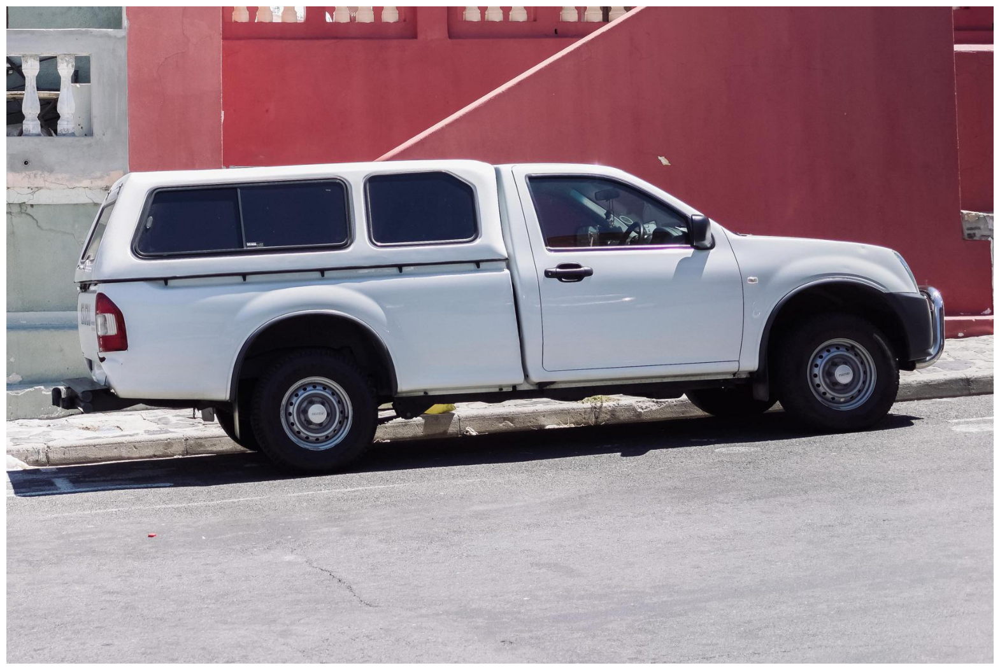

In [5]:
image = cv2.imread("research/sam/images/truck.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()

In [6]:
# 提前设置image，使用vit抽取image特征，保存在pipeline中
pipeline_task.set_image(image)

In [8]:
# 1. 单点确定一个物体
input_point = np.array([[500, 375]])
input_label = np.array([1])
outputs = pipeline_task({"points": input_point,
                         "labels": input_label},
                        multimask_output=True)

masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits_single = outputs["low_res_masks"]

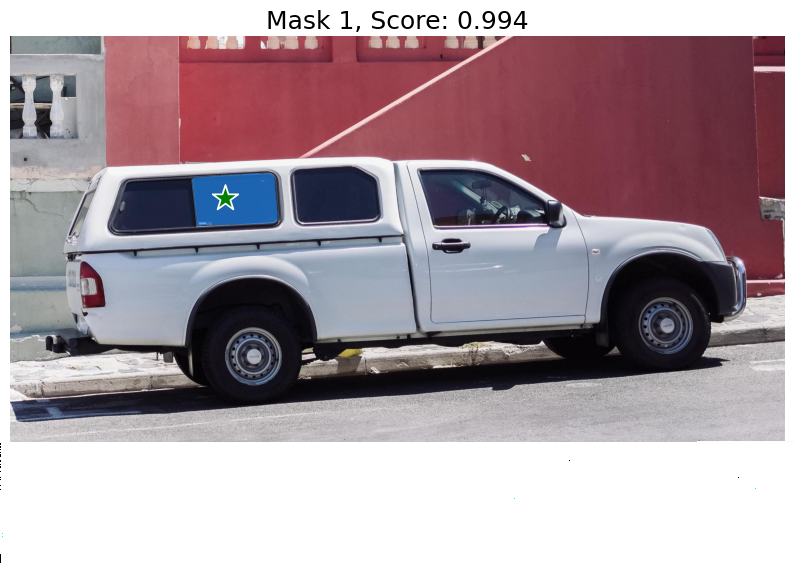

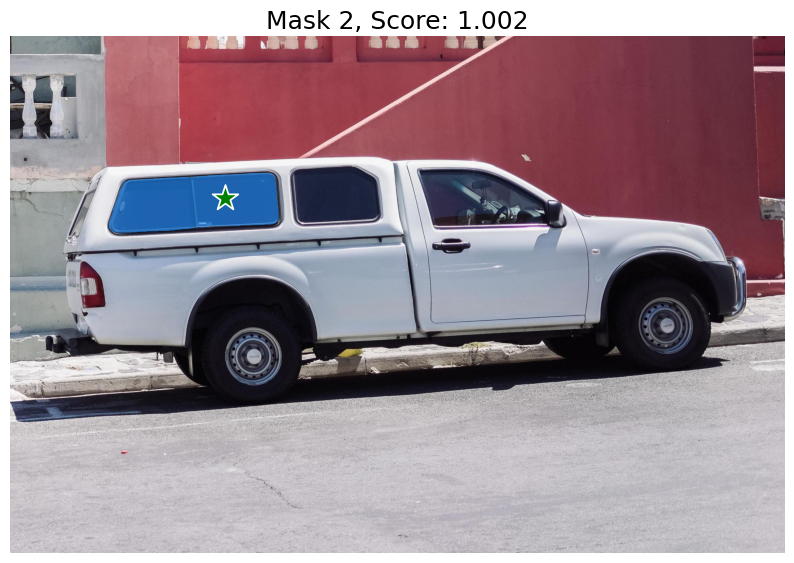

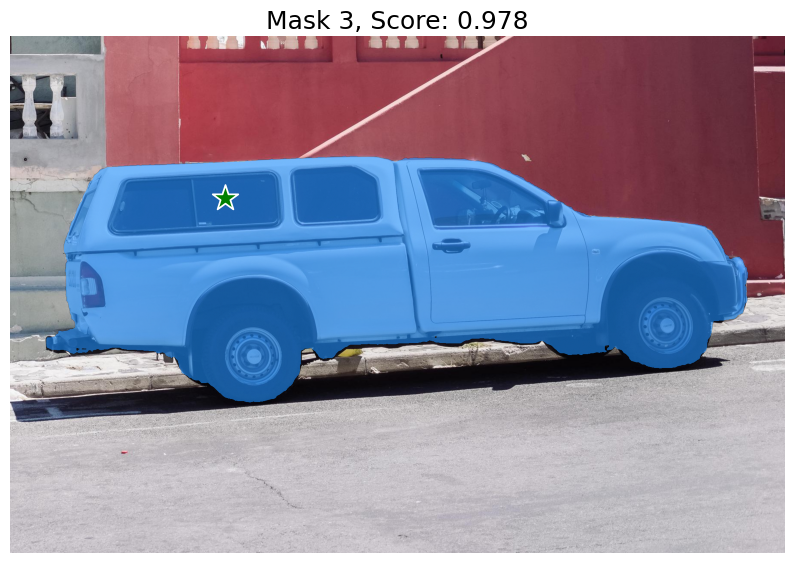

In [9]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

In [11]:
# 2.两点确定相同物体
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

outputs = pipeline_task({"points": input_point,
                         "labels": input_label},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

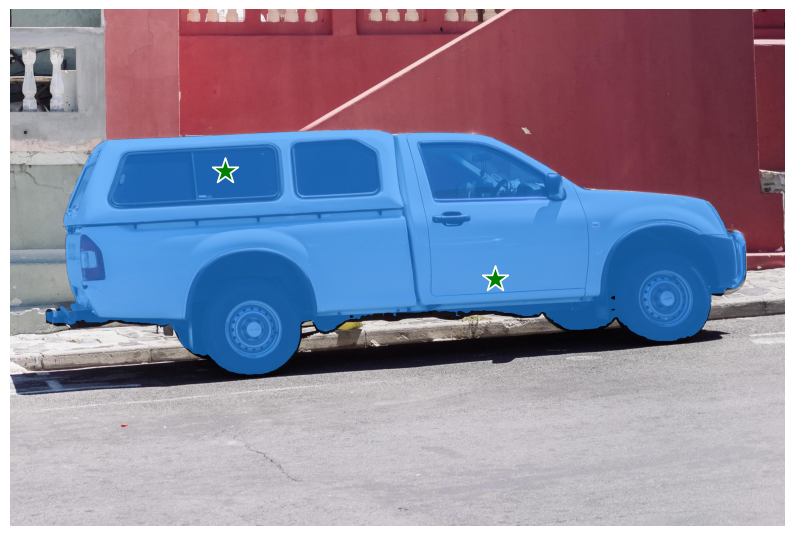

In [12]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

In [14]:
# 3.两点确定不同物体
input_point = np.array([
        [[500, 375]],
        [[1125, 625]],
    ])
input_label = np.array([[1], [1]])

outputs = pipeline_task({"points": input_point,
                         "labels": input_label},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

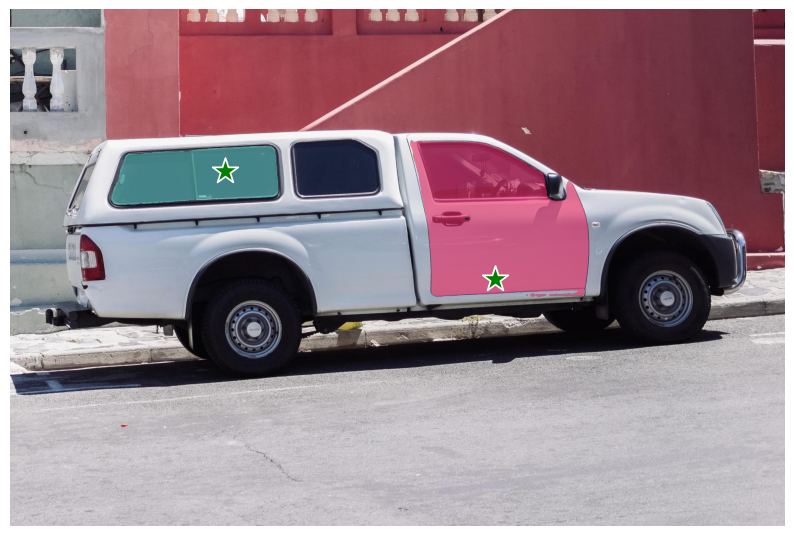

In [15]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask, plt.gca(), random_color=True)
show_points(input_point.reshape(-1, 2), input_label.reshape(-1), plt.gca())
plt.axis('off')
plt.show()

In [19]:
# 4.一个前景点和背景点
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

outputs = pipeline_task({"points": input_point,
                         "labels": input_label},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

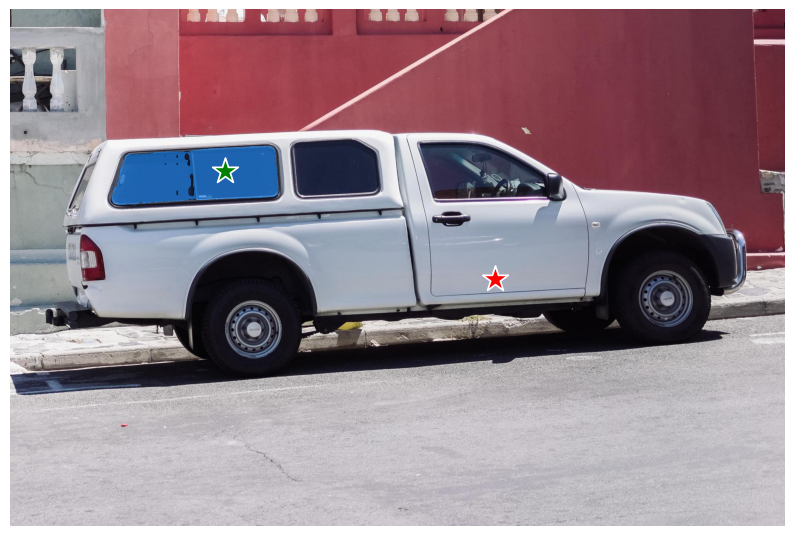

In [20]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

In [22]:
# 5.单框确定一个物体
input_box = np.array([425, 600, 700, 875])

outputs = pipeline_task({"boxes": input_box},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

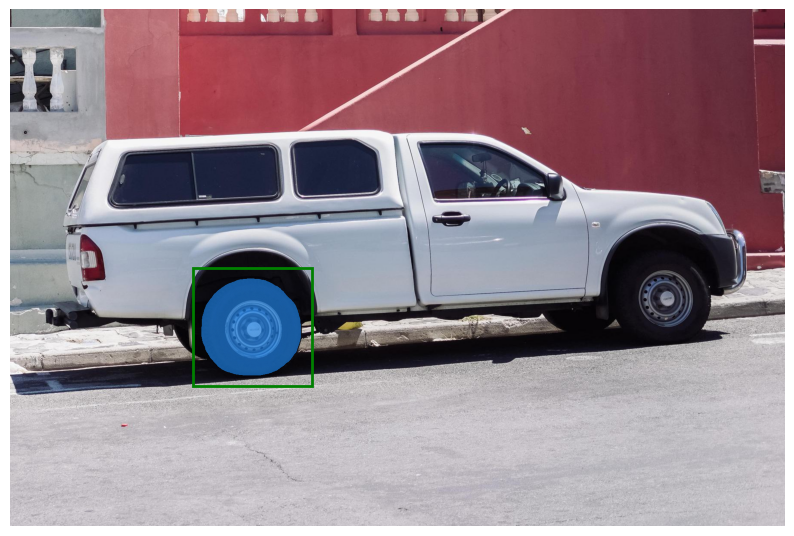

In [23]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

In [25]:
# 6.框和背景点确定物体
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

outputs = pipeline_task({"points": input_point,
                         "labels": input_label,
                         "boxes": input_box},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

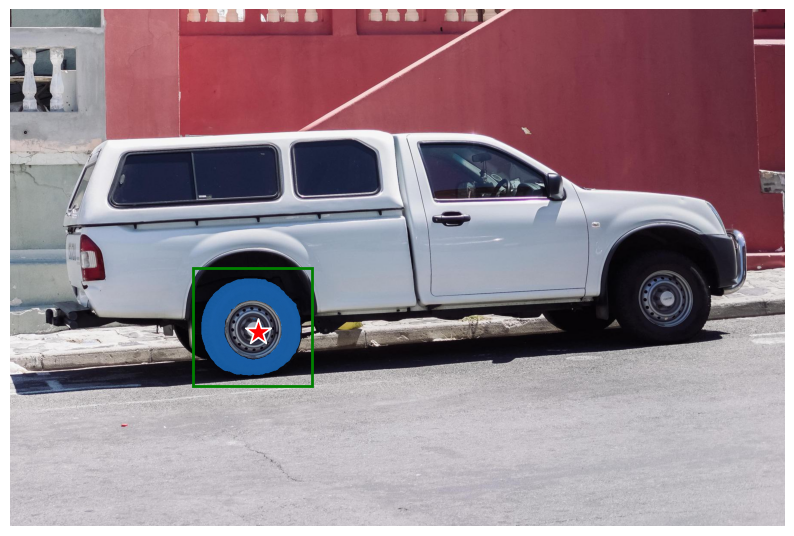

In [26]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

In [28]:
# 7.多组框和点确定不同物体
input_boxes = np.array([[425, 600, 700, 875],
                        [1360, 525, 1680, 780]])
input_points = np.array([[[575, 750]],
                         [[1525, 670]]])
input_labels = np.array([[1], [1]])

outputs = pipeline_task({"points": input_points,
                         "labels": input_labels,
                         "boxes": input_boxes},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

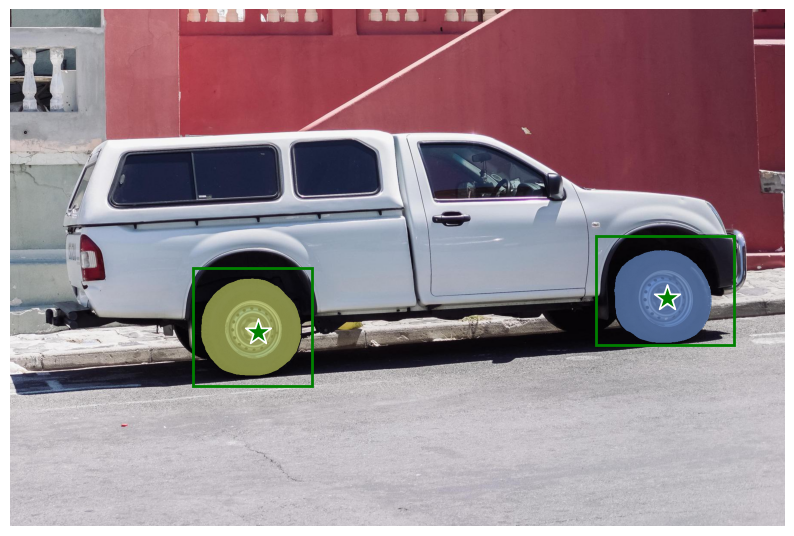

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask, plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box, plt.gca())
for point, label in zip(input_points, input_labels):
    show_points(point, label, plt.gca())
plt.axis('off')
plt.show()

In [31]:
# 8.多个框确定不同物体
input_boxes = np.array([
        [75, 275, 1725, 850],
        [425, 600, 700, 875],
        [1375, 550, 1650, 800],
        [1240, 675, 1400, 750],
    ])

outputs = pipeline_task({"boxes": input_boxes},
                        multimask_output=False)
masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits = outputs["low_res_masks"]

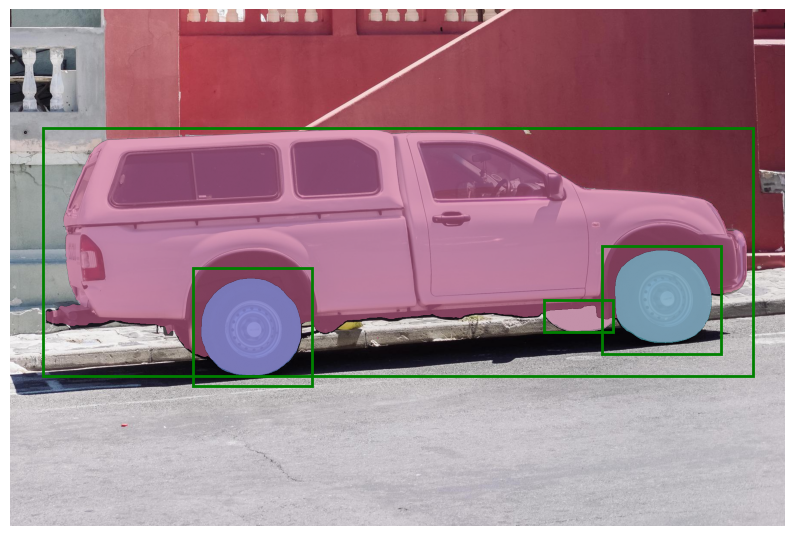

In [32]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask, plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box, plt.gca())
plt.axis('off')
plt.show()

In [34]:
# 单点确定一个物体：直接传入图像路径和prompt
input_point = np.array([[500, 375]])
input_label = np.array([1])
outputs = pipeline_task({"image": "research/sam/images/truck.jpg",
                         "points": input_point,
                         "labels": input_label},
                        multimask_output=True)

masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits_single = outputs["low_res_masks"]

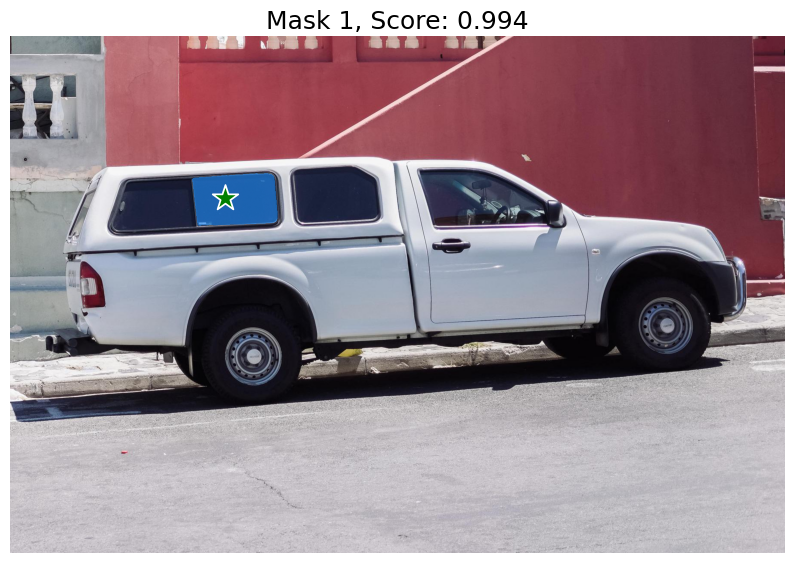

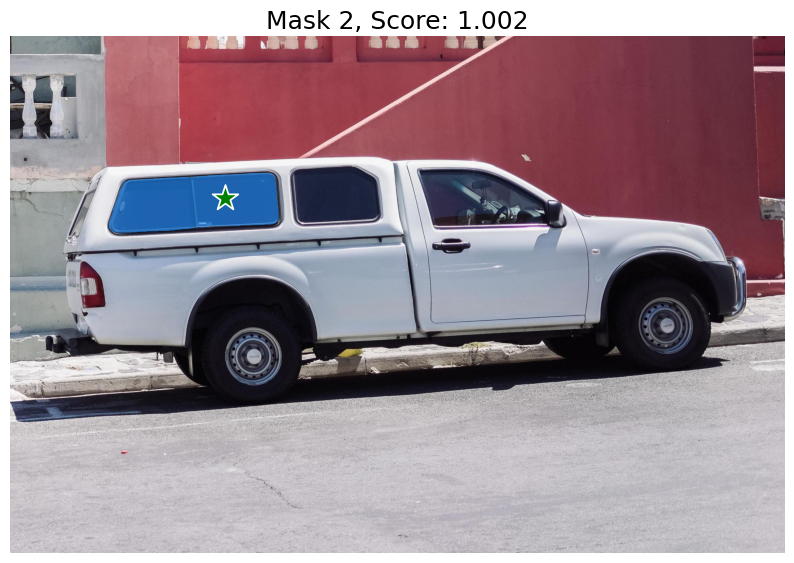

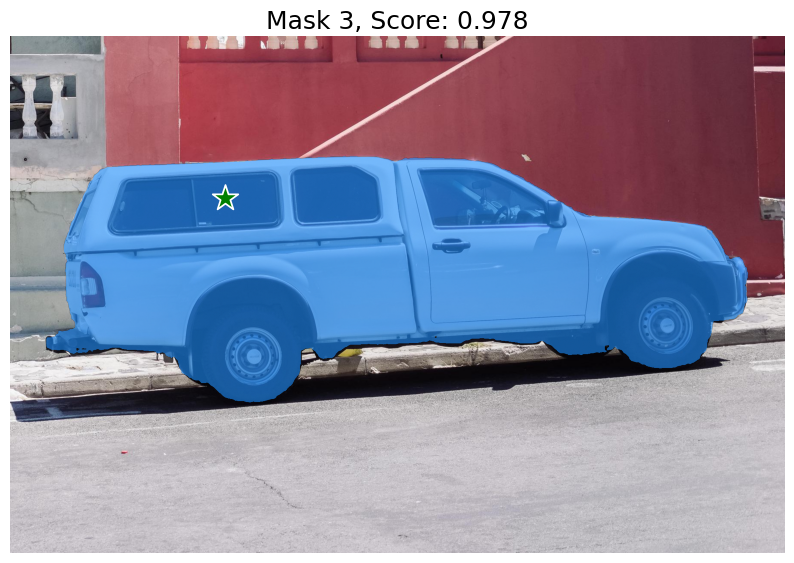

In [35]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

In [36]:
# 单点确定一个物体：直接传入cv2图像和prompt
image = cv2.imread("research/sam/images/truck.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [37]:
input_point = np.array([[500, 375]])
input_label = np.array([1])
outputs = pipeline_task({"image": image,
                         "points": input_point,
                         "labels": input_label},
                        multimask_output=True)

masks = outputs["masks"]
scores = outputs["iou_predictions"]
logits_single = outputs["low_res_masks"]

2023-08-23 17:40:21,428 - mindformers - INFO - You seem to be using the pipeline sequentially for numerous samples. In order to maximize efficiency please set input a mindspore.dataset.GeneratorDataset.


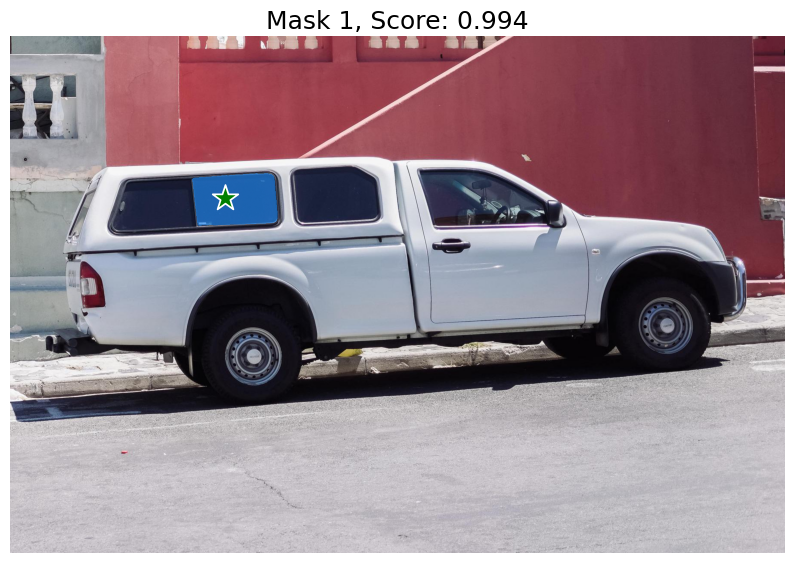

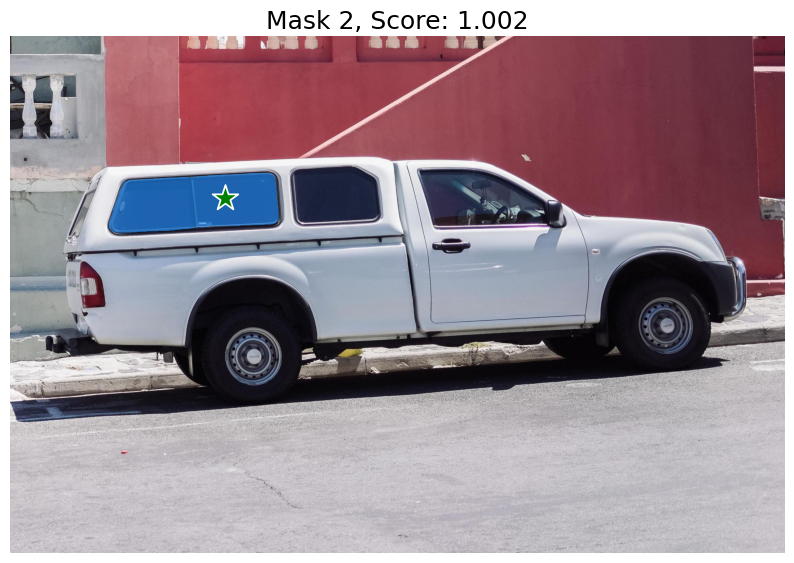

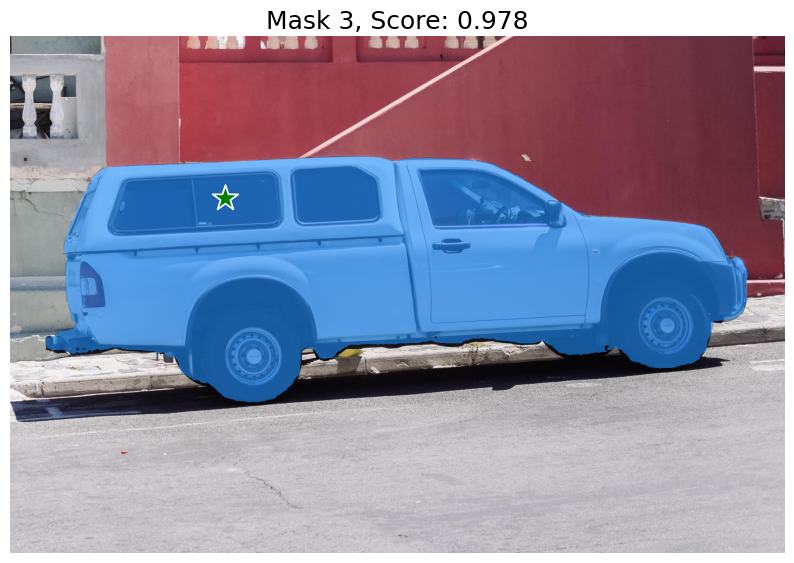

In [38]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()